# Exploratory Data Analysis for Time Series

In this notebook we will focus on studying the main time series components for each of the variables. The steps will be described below, but they will be repeated in each one of the variables. This analysis comes after the initial EDA done block by block, where we studied the different data fields and their distribution.

First of all, we will define some basic time series concepts (they are explained in natural language, for more information, refer to the complete thesis):
- **Stationarity**: a stationary time series is a time series where statistical properties do not change over time.
- **Time series decomposition**: when we consider a series as a combination of level, trend, seasonality and noise components, we can have an additive model or a multiplicative model.
- **Trend**: a trend component is the result of a varying mean over time.
- **Seasonality**: the seasonality component is a changing variance over time.
- **Differencing**: data transformation used to make a series stationary, it is performed by subtracting the previous observation from the current observation.
- **Lag difference**: the difference between consecutive observations is called a lag-1 difference.


In [1]:
# Basic imports

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from statsmodels.tsa.filters.hp_filter import hpfilter
from scipy import signal

from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

import statsmodels.api as sm
import pymannkendall as mk

from pandas.plotting import autocorrelation_plot

path = "../data_postprocess/data_definitivo/"
path_bruto = "../data/"

## Energy use 

We will study the following properties:
1. Trend detection
    - We will try detrending with multiple tools
2. Seasonality with multiple box plots and autocorrelation plots
    - Seasonal decomposition
3. Cyclical Variations
4. Possible decompositions


This variable has been preprocessed and cropped so that we have information from all the other variables. We will repeat this study with the complete time series, and we will compare both of them.

In [2]:
# Importamos csv
energy_use = pd.read_csv(path+'ele_postprocess.csv')
#We change the date column into datetime format
energy_use['date']= pd.to_datetime(energy_use['date'])
energy_use.set_index('date', inplace=True)
energy_use= energy_use.clip(lower=0.01)


The first variable we will study is 'mels_S' (miscellaneous energy use in the south wing of the building).

In [3]:
var = 'mels_S'

Text(0.5, 1.0, 'Energía utilizada en el ala sur')

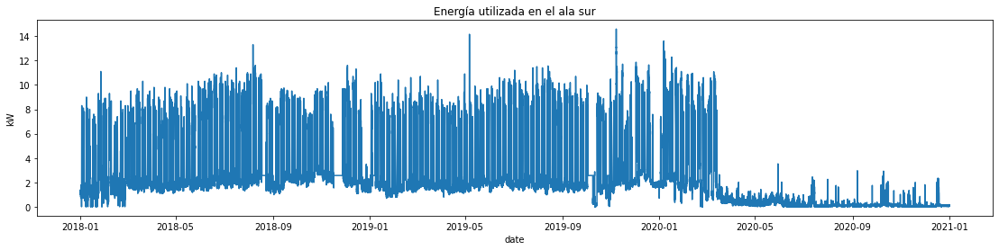

In [4]:
plt.figure(figsize=(19,4))
sns.lineplot(x =energy_use.index , y=energy_use[var])
plt.ylabel('kW')

plt.title('Energía utilizada en el ala sur')

In [6]:
# We crop until March 2020, since it's the expected normal use (covid effect)

energy_use=energy_use[energy_use.index < '2020-03-01 00:00:00']

### 1. Trend detection

We will run two tests for trend detection:
- **Mann–Kendall trend test**: https://www.frontiersin.org/articles/10.3389/feart.2020.00014/full
- **Hodrick–Prescott filter**: https://eprints.whiterose.ac.uk/97954/1/HP_ACM.pdf

In [5]:
print(mk.original_test(energy_use[var], alpha=0.05))

KeyboardInterrupt: 

In [7]:
def plot_hpfilter(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_trend.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.title(title)

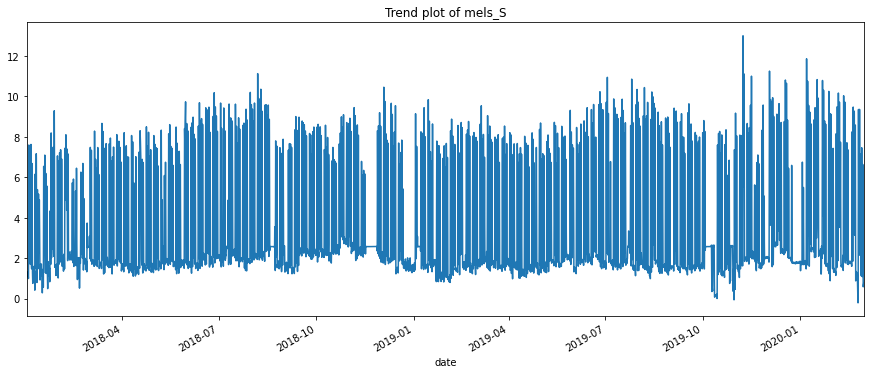

In [8]:
plot_hpfilter(energy_use, var, 'Trend plot of mels_S')

We don't really see a very clear trend, however, there is some seasonal pattern in the years 2018 and 2019. The last year (2020) is completely different, which makes sense since the use of the building decreased due to the pandemic.

#### Detrending

Even if we don't really have a clear trend, we want to check these tools and see if there are some subtrends that we didn't catch in our first analysis.(Mathematical explanation in https://link.springer.com/content/pdf/10.1007/978-1-4419-0320-4.pdf)


In [9]:
def plot_detrends(df, var):

    fig, axes = plt.subplots(nrows=3,ncols=1, figsize=(10,10) )
    diff = df[var].diff()

    axes[0].plot(diff)
    axes[0].set_title('Detrending using Differencing', fontsize=12) 
    axes[0].set_xlabel('Date')
    axes[0].set_ylabel(var)


    detrended = signal.detrend(df[var].values)
    axes[1].plot(detrended)
    axes[1].set_title('Detrending using Scipy Signal', fontsize=12) 
    axes[1].set_xlabel(var)
    axes[1].set_ylabel('Frequency')

    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600)
    detrended = df[var]-eu_trend
    axes[2].plot(detrended)
    axes[2].set_title('Detrending using HP Filter', fontsize=12) 
    axes[2].set_xlabel('Date')
    axes[2].set_ylabel(var)
    plt.suptitle('Detrending: '+ var, fontsize=16)
    plt.tight_layout()

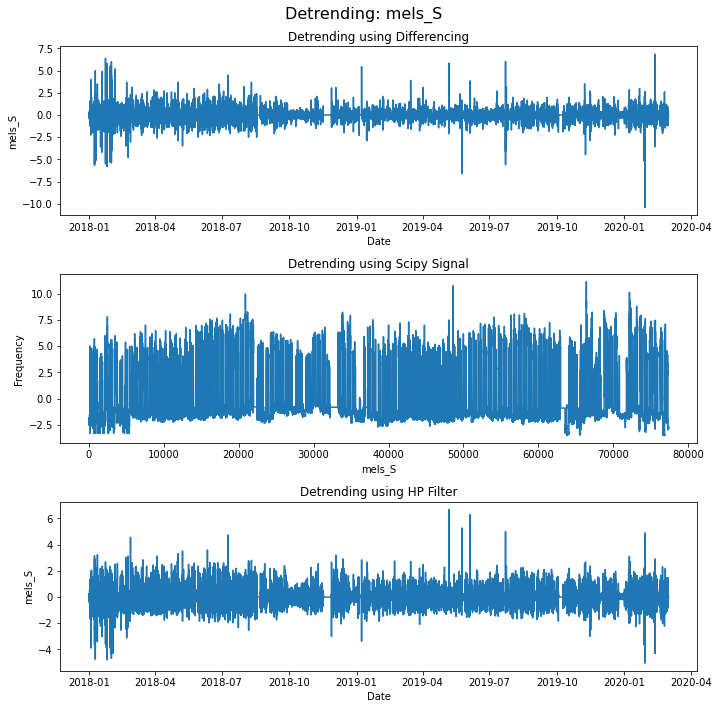

In [10]:
plot_detrends(energy_use, var)

### 2. Seasonality 

We will study seasonality with Multiple Box Plots and Autocorrelation Plots:

#### Multiple Box Plots

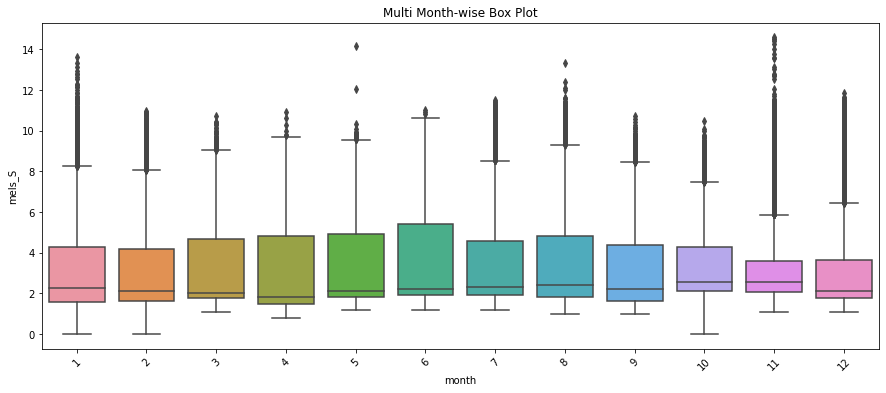

In [15]:
energy_use['month'] = energy_use.index.month
plt.figure(figsize=(15,6))
sns.boxplot(x='month', y=var, data=energy_use)
plt.title("Multi Month-wise Box Plot")
plt.xticks(rotation=45)
plt.show()

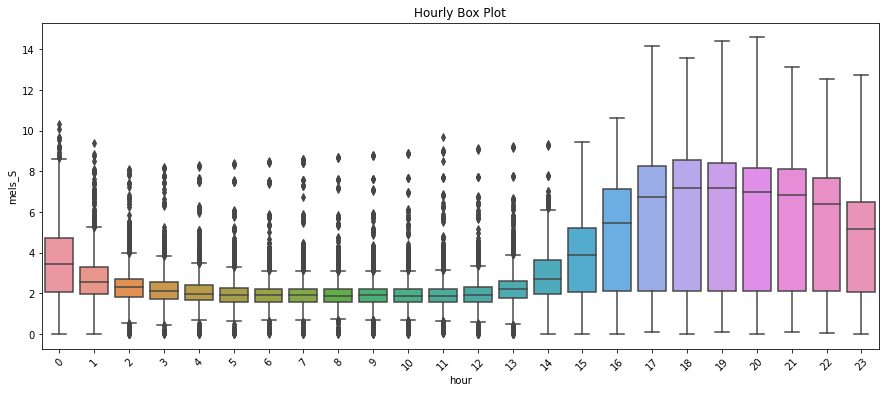

In [16]:
energy_use['hour'] = energy_use.index.hour
plt.figure(figsize=(15,6))
sns.boxplot(x='hour', y=var, data=energy_use)
plt.title("Hourly Box Plot")
plt.xticks(rotation=45)
plt.show()

We don't see a seasonal pattern in the box plot, we will try to plot it again with detrended time series, using differencing:



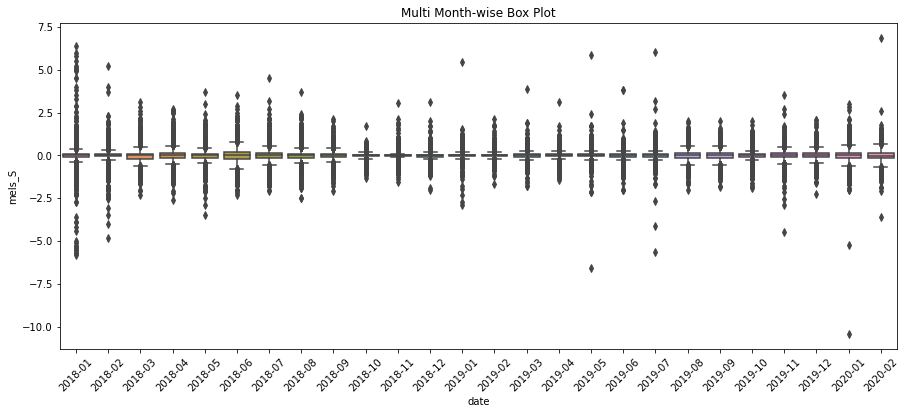

In [12]:
diff = energy_use[var].diff()
months = diff.index.to_period("M")
diff.columns = [var, 'month']
plt.figure(figsize=(15,6))
sns.boxplot(x=months, y=diff)
plt.title("Multi Month-wise Box Plot")
plt.xticks(rotation=45)
plt.show()

#### Autocorrelation and partial autocorrelation plots

Mathematical explanation of autocorrelation plots: https://www.itl.nist.gov/div898/handbook/eda/section3/autocopl.htm



<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

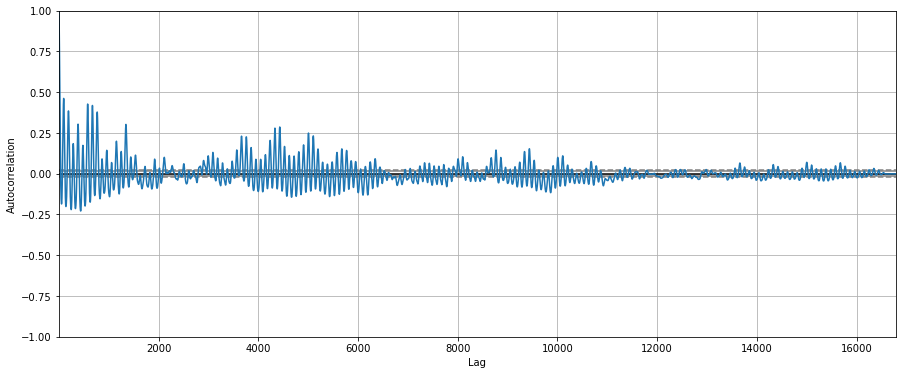

In [20]:
plt.figure(figsize=(15,6))
autocorrelation_plot(energy_use[var].tolist())

(0.0, 7000.0)

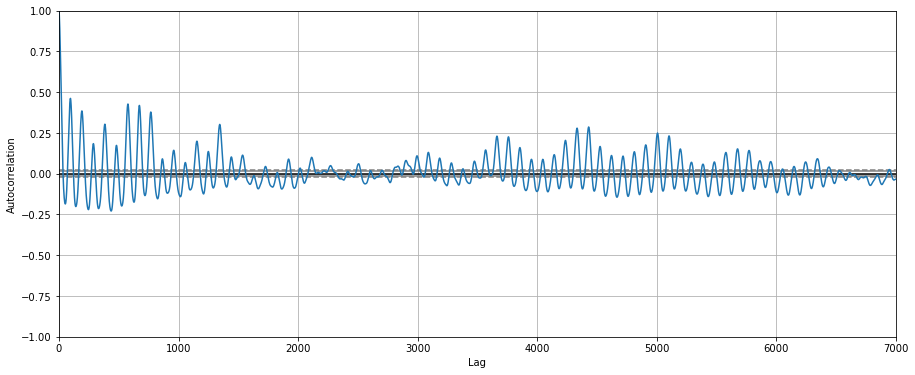

In [21]:
plt.figure(figsize=(15,6))

autocorrelation_plot(energy_use[var].tolist()).set_xlim([0,7000])

We can see that the initial autocorrelation plot didn't really show any seasonality, but once we "zoom in" (we change the lag in the x axis), we can clearly see some pattern. One reason for this could be that when we reduce the lag we are checking the pattern day by day, instead of a generic pattern, so clearly the correlation between measures at the same time of different days is going to be higher than the one between random measures in different days of the three years.


We check another way of plotting the same thing:




<Figure size 1080x432 with 0 Axes>

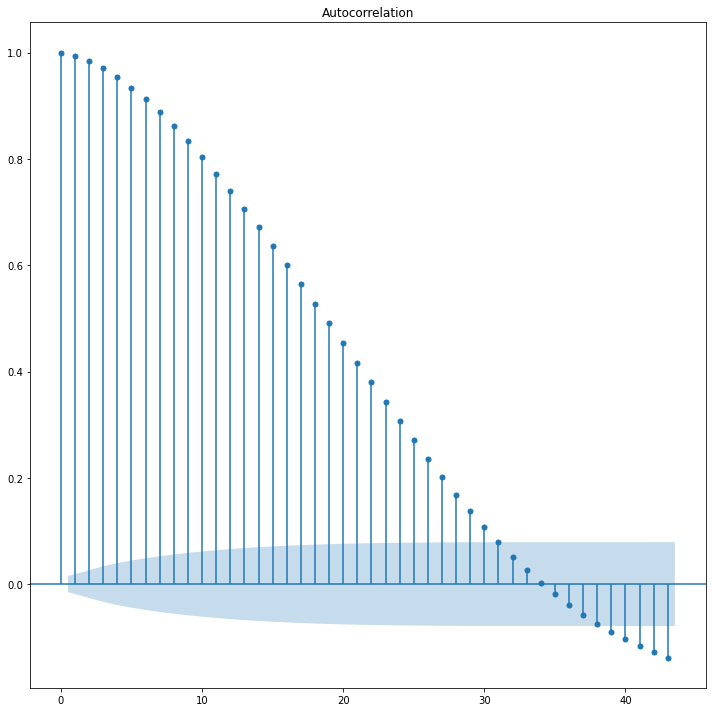

In [22]:
plt.figure(figsize=(15,6))
fig=plot_acf(energy_use[var])
fig.set_figheight(10)
fig.set_figwidth(10)
fig.tight_layout()
plt.show()

<Figure size 1080x432 with 0 Axes>

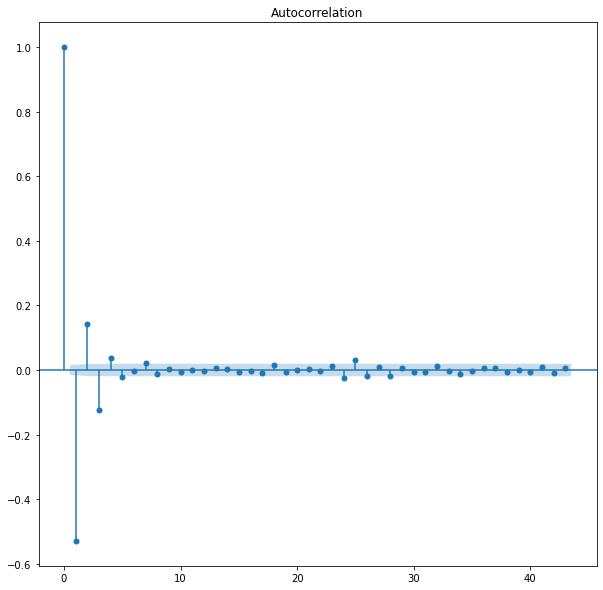

In [23]:
#We also plot the autocorrelation plot of the differenced time series:

fig =plt.figure(figsize=(15,6))
fig=plot_acf(energy_use[var].diff().diff().dropna())
fig.set_figheight(10)
fig.set_figwidth(10)
plt.show()

#### Partial Autocorrelation Plots

A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.

<Figure size 72x432 with 0 Axes>

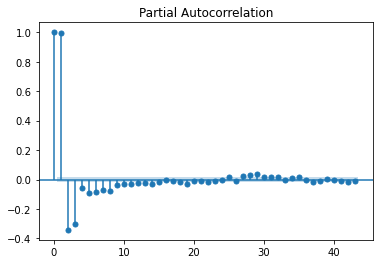

In [24]:
plt.figure(figsize=(1,6))

plot_pacf(energy_use[var],method='ols' ) #Probar varios métodos
plt.show()

### 3. Seasonal decomposition

We can use seasonal decomposition to remove seasonality from data and check the data only with the trend, cyclic, and irregular variations.

In [25]:
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_seasonal_decompose(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    deseason = df[var] - result_mul.seasonal
    plt.figure(figsize=(15,6))
    plt.plot(deseason)
    plt.title('Deseasoning using seasonal_decompose (' +model+ ' model)', fontsize=12) 
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.show()



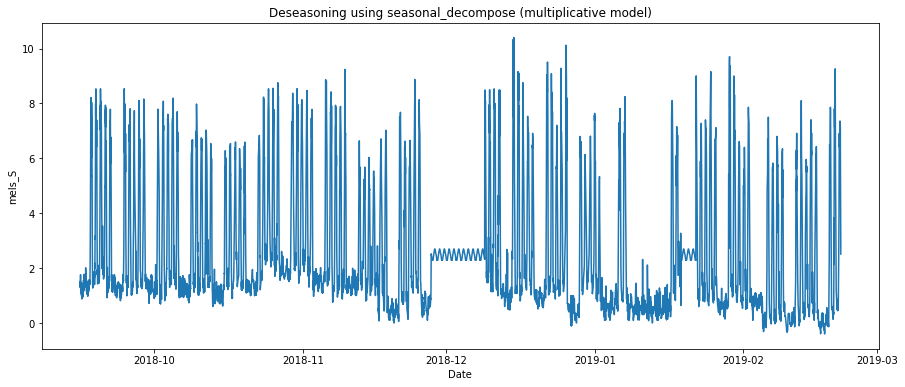

In [26]:
#FREQ OF DAY
plot_seasonal_decompose(energy_use, var, 'multiplicative', 96)

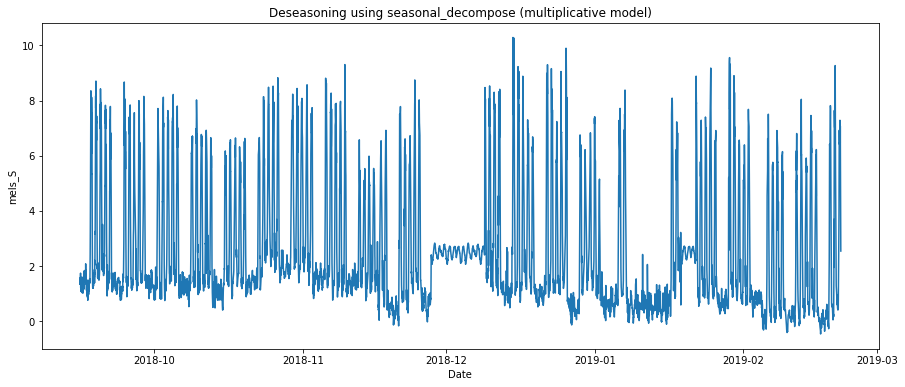

In [27]:
#FREQ OF DAY
plot_seasonal_decompose(energy_use, var, 'multiplicative', 672)

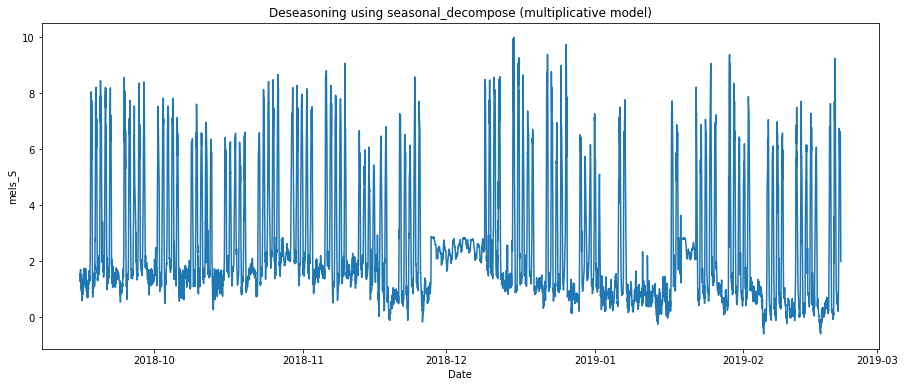

In [28]:
plot_seasonal_decompose(energy_use, var, 'multiplicative', 2880)

In [42]:

def plot_seasonal(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    res = result_mul.seasonal

    fig = go.Figure()
    result_mul = seasonal_decompose(energy_use[var], model=model, period = period)
    res = result_mul.seasonal
    fig.add_trace(
        go.Scatter(x=list(df.index), y=list(res)))

    # Set title
    fig.update_layout(
        title_text='seasonal_decompose (' +model+ ' model) with freq= ' +str(int(period/(4*24))) + " days", 
        title_font_size=20
    )

    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1m",
                        step="month",
                        stepmode="backward"),
                    dict(count=6,
                        label="6m",
                        step="month",
                        stepmode="backward"),
                    dict(count=1,
                        label="YTD",
                        step="year",
                        stepmode="todate"),
                    dict(count=1,
                        label="1d",
                        step="day",
                        stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig.show()


In [43]:
plot_seasonal(energy_use, var, 'add', 96)

In [44]:
plot_seasonal(energy_use, var, 'add', 672)

In [45]:
plot_seasonal(energy_use, var, 'multiplicative', 2880)

### 4. Cyclical Components
Cyclical components are fluctuations around a long trend observed every few units of time. We will use one more time the HP Filter to detect them:

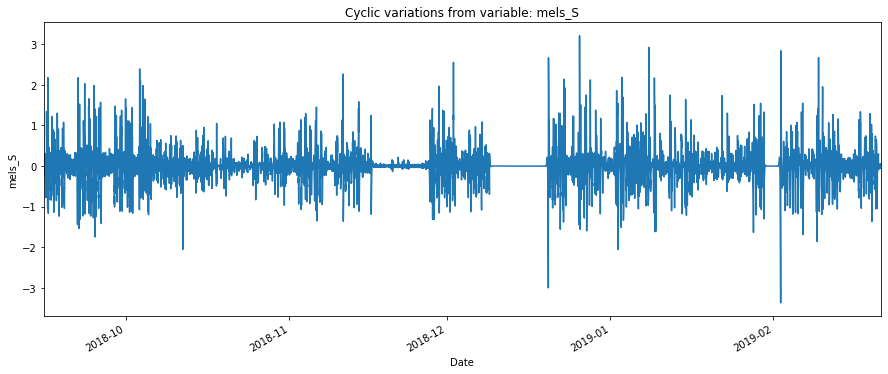

In [45]:
def plot_hpfilter2(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_cycle.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.xlabel('Date')
    plt.ylabel(var)  
    plt.title(title)
plot_hpfilter2(energy_use, var, 'Cyclic variations from variable: ' + var)

### 5. Decomposition of time series



In [46]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

def mostrar_descomp(df, variable, period):
    # Multiplicative Decomposition 
    multiplicative_decomposition = seasonal_decompose(df[variable], model='multiplicative', period = period)

    # Additive Decomposition
    additive_decomposition = seasonal_decompose(df[variable], model='add', period = period)

    # Plot
    plt.rcParams.update({'figure.figsize': (10,8)})

    multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition with freq= ' +str(int(period/(4*24))) + " days", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    multiplicative_decomposition.plot().suptitle('Additive Decomposition with freq= ' +str(int(period/(4*24))) + " days", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    plt.show()




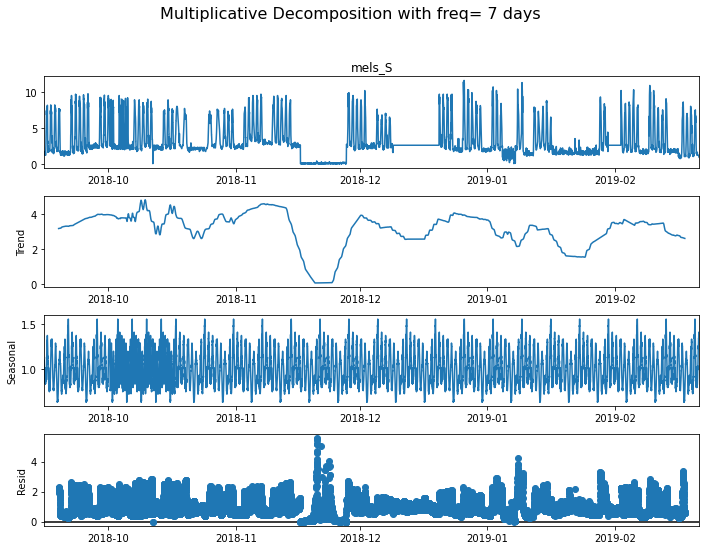

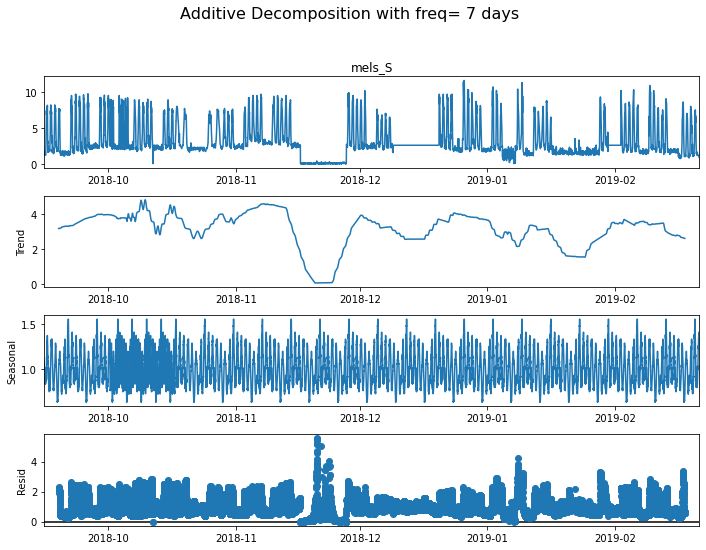

In [47]:
#Monthly period (means that the cycle of seasonality is a week)
mostrar_descomp(energy_use, var, 672)

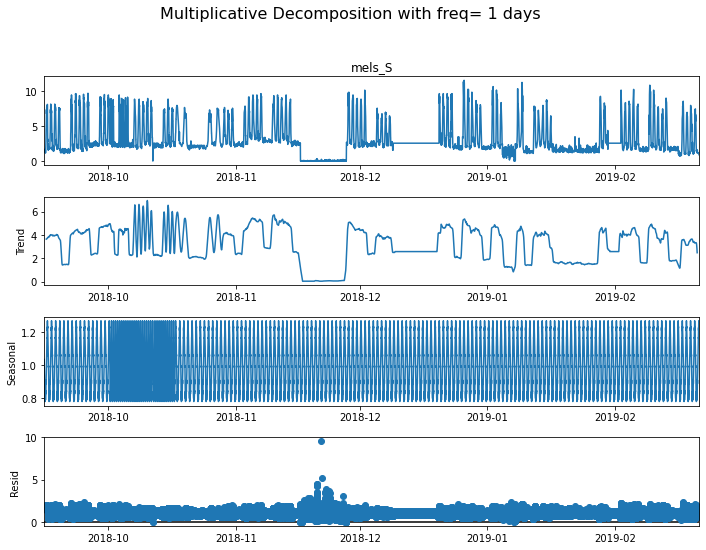

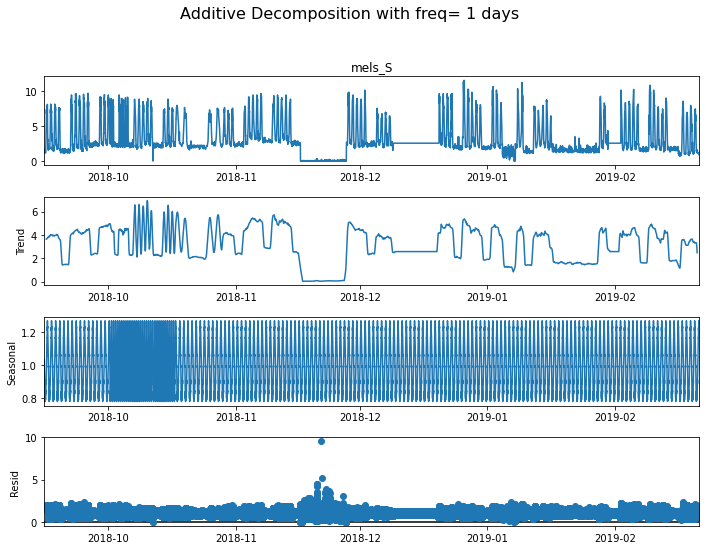

In [48]:
#Daily period (means that the cycle of seasonality is a day)
mostrar_descomp(energy_use, var, 96)

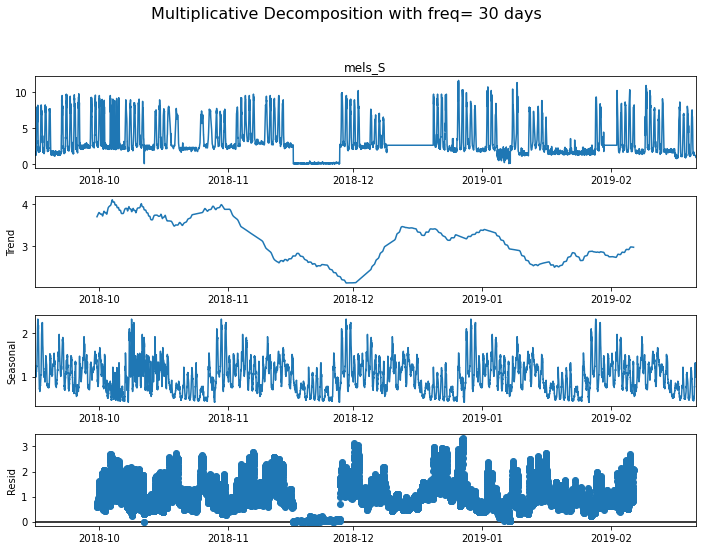

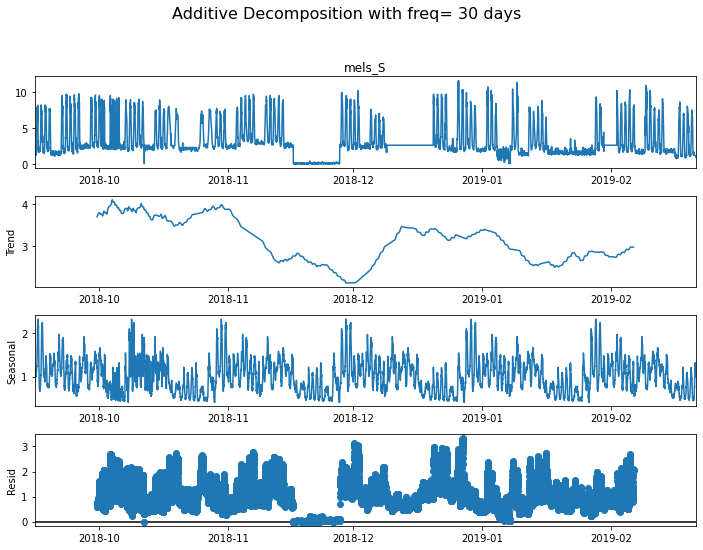

In [49]:
#Monthly period (means that the cycle of seasonality is a week)
mostrar_descomp(energy_use, var, 2880)

### 6. Rolling Statistics plot

We are going to plot the rolling mean and standard deviation of the time series, with a window of a week (672 rows)

In [50]:
def plot_rolling_stats(series, period):

    #Determine rolling statistics
    rolling_avg = series.rolling(window=period).mean() 
    rolling_std = series.rolling(window=period).std() 

    #Plot rolling statistics
    plt.figure(figsize=(15,7))
    plt.plot(series, color='#379BDB', label='Original')
    plt.plot(rolling_avg, color='#D22A0D', label='Rolling Mean')
    plt.plot(rolling_std, color='#142039', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation with rolling window of= ' +str(int(period/(4*24))) + " days")
    plt.show(block=False)




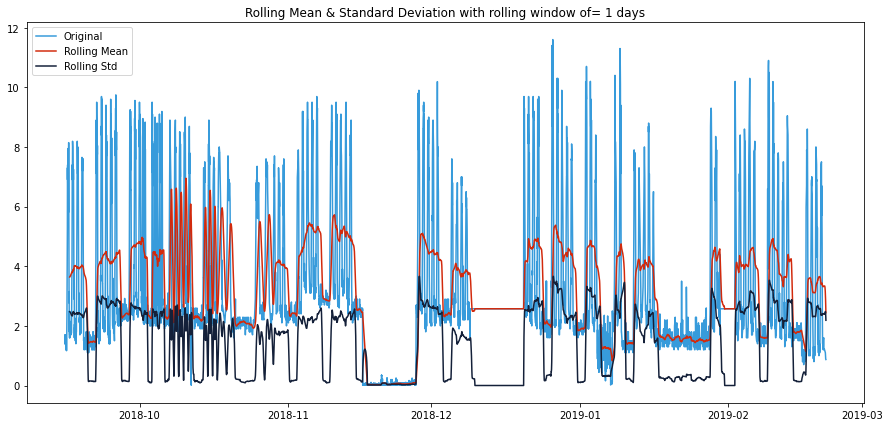

In [51]:
plot_rolling_stats(energy_use[var], 4)

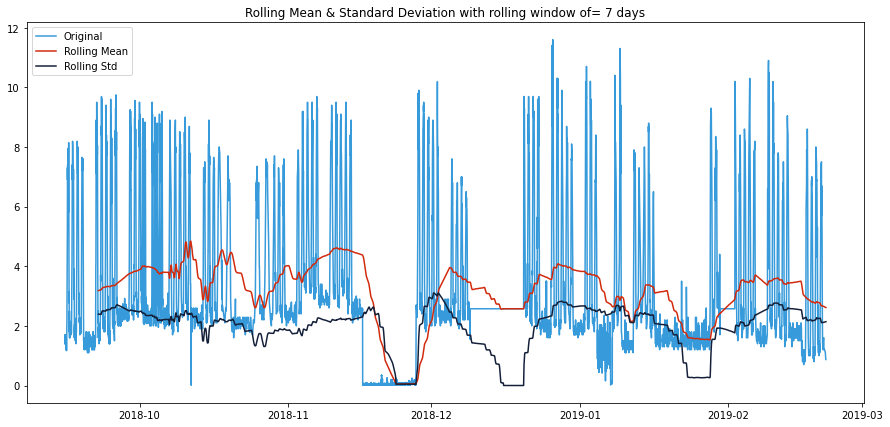

In [52]:
plot_rolling_stats(energy_use[var], 672)

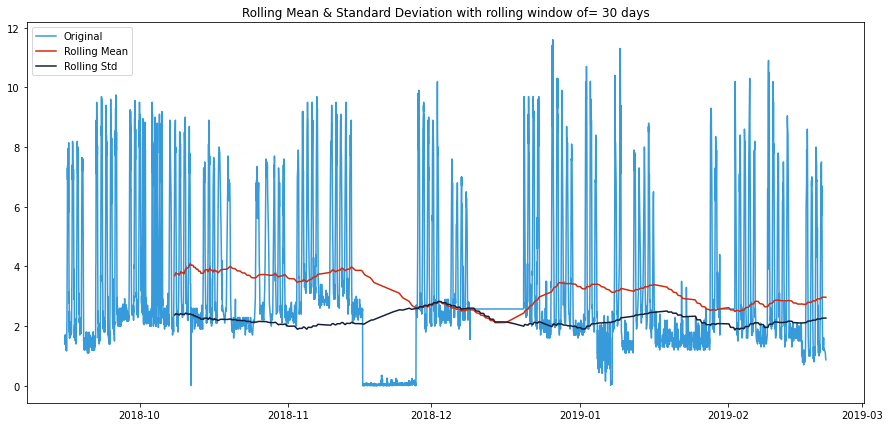

In [53]:
plot_rolling_stats(energy_use[var], 2880)

Next, we will repeat the exact same plot but this time with the differenced time series, to check how the statistical properties change with time:


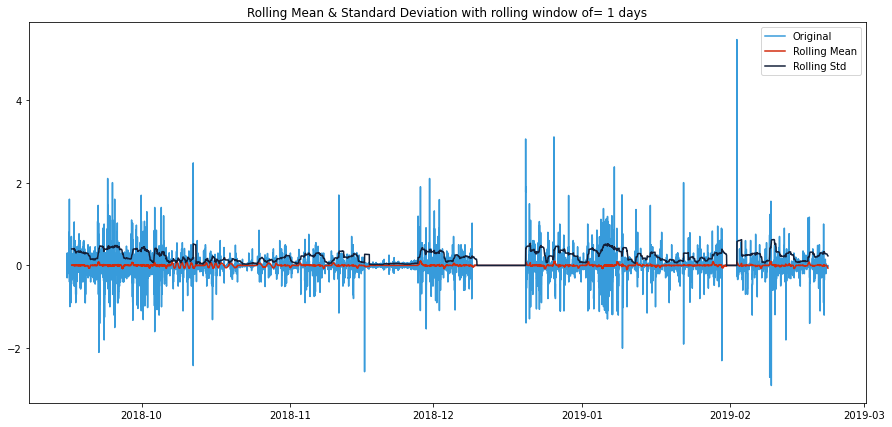

In [54]:
plot_rolling_stats(energy_use[var].diff().dropna(), 96)

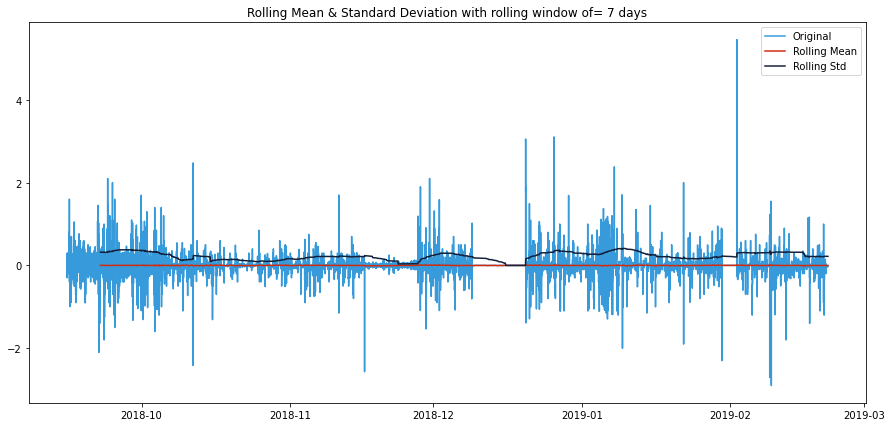

In [55]:
plot_rolling_stats(energy_use[var].diff().dropna(), 672)

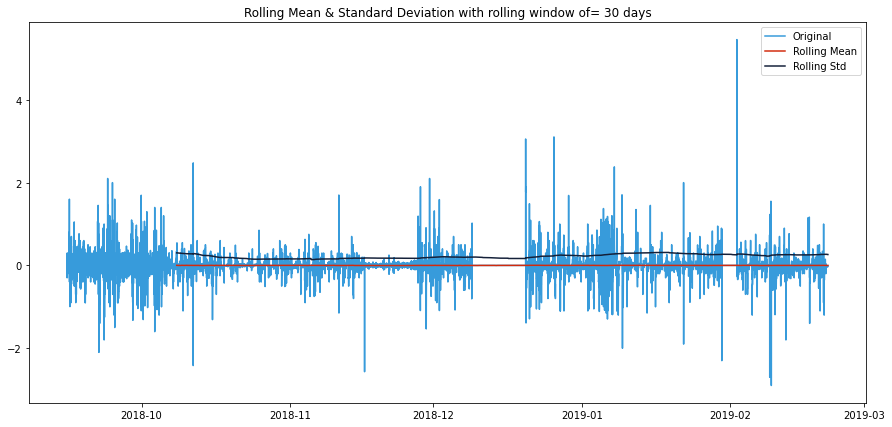

In [56]:
plot_rolling_stats(energy_use[var].diff().dropna(), 2880)

### 7. Dickey Fuller Test for stationarity

Finally, we will run the dickey fuller (https://atsa-es.github.io/atsa-labs/sec-boxjenkins-aug-dickey-fuller.html) test on this variable

In [57]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(energy_use[var], autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  

ADF Statistic: -13.864998042580499
n_lags: 6.622586664719716e-26
p-value: 6.622586664719716e-26
Critial Values:
   1%, -3.430740395884487
Critial Values:
   5%, -2.8617125394182246
Critial Values:
   10%, -2.566861838337698


Since the p-value is lower than 0.5, we can reject the null hypothesis: the time series is non stationary, this means that the time series is stationary.

We will now repeat the test with the differenced time series:

In [58]:
result = adfuller(energy_use[var].diff().dropna(), autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  


ADF Statistic: -27.468272152897132
n_lags: 0.0
p-value: 0.0
Critial Values:
   1%, -3.430740442503284
Critial Values:
   5%, -2.86171256002052
Critial Values:
   10%, -2.5668618493040105


The result is the same, but in the plot we can see that the stationarity of the time series is much more evident in the differenced one.

## Complete time series





In [ ]:
# Importamos csv
energy_use = pd.read_csv(path_bruto+'ele.csv')
#We change the date column into datetime format
energy_use['date']= pd.to_datetime(energy_use['date'])
energy_use.set_index('date', inplace=True)
energy_use= energy_use.clip(lower=0.01)


The first variable we will study is 'mels_S' (miscellaneous energy use in the south wing of the building).

In [ ]:
var = 'mels_S'

Text(0.5, 1.0, 'Energía utilizada en el ala sur')

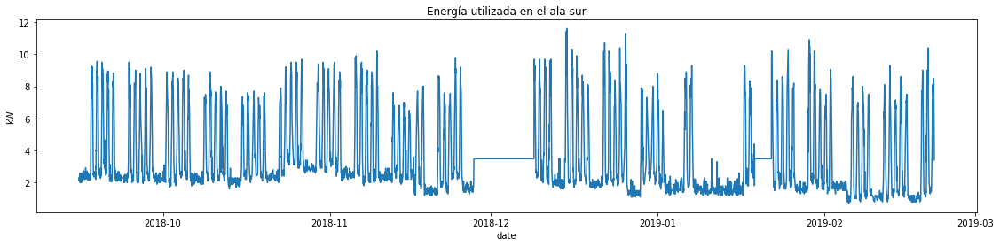

In [ ]:
plt.figure(figsize=(19,4))
sns.lineplot(x =energy_use.index , y=energy_use[var])
plt.ylabel('kW')

plt.title('Energía utilizada en el ala sur')

### 1. Trend detection

We will run two tests for trend detection:
- **Mann–Kendall trend test**: https://www.frontiersin.org/articles/10.3389/feart.2020.00014/full
- **Hodrick–Prescott filter**: https://eprints.whiterose.ac.uk/97954/1/HP_ACM.pdf

In [ ]:
print(mk.original_test(energy_use[var], alpha=0.05))

Mann_Kendall_Test(trend='decreasing', h=True, p=0.0, z=-36.60891504860426, Tau=-0.18831647299057203, s=-26542012.0, var_s=525646689070.6667, slope=-6.749610328991318e-05, intercept=3.094323311567176)


In [ ]:
def plot_hpfilter(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_trend.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.title(title)

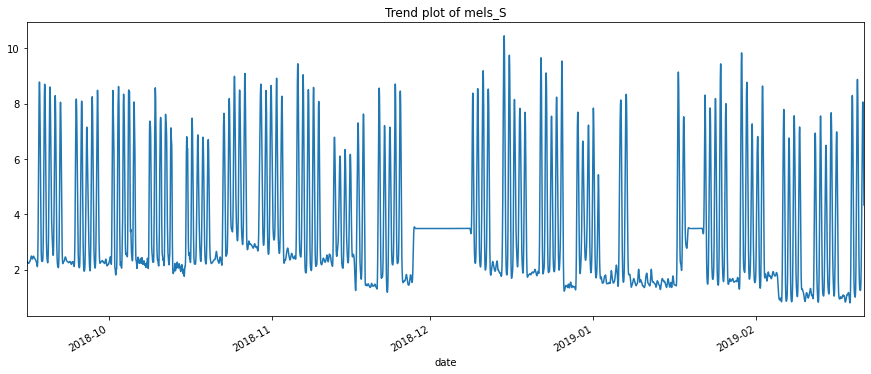

In [ ]:
plot_hpfilter(energy_use, var, 'Trend plot of mels_S')

We don't really see a very clear trend, however, there is some seasonal pattern in the years 2018 and 2019. The last year (2020) is completely different, which makes sense since the use of the building decreased due to the pandemic.

#### Detrending

Even if we don't really have a clear trend, we want to check these tools and see if there are some subtrends that we didn't catch in our first analysis.(Mathematical explanation in https://link.springer.com/content/pdf/10.1007/978-1-4419-0320-4.pdf)


In [ ]:
def plot_detrends(df, var):

    fig, axes = plt.subplots(nrows=3,ncols=1, figsize=(10,10) )
    diff = df[var].diff()

    axes[0].plot(diff)
    axes[0].set_title('Detrending using Differencing', fontsize=12) 
    axes[0].set_xlabel('Date')
    axes[0].set_ylabel(var)


    detrended = signal.detrend(df[var].values)
    axes[1].plot(detrended)
    axes[1].set_title('Detrending using Scipy Signal', fontsize=12) 
    axes[1].set_xlabel(var)
    axes[1].set_ylabel('Frequency')

    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600)
    detrended = df[var]-eu_trend
    axes[2].plot(detrended)
    axes[2].set_title('Detrending using HP Filter', fontsize=12) 
    axes[2].set_xlabel('Date')
    axes[2].set_ylabel(var)
    plt.suptitle('Detrending: '+ var, fontsize=16)
    plt.tight_layout()

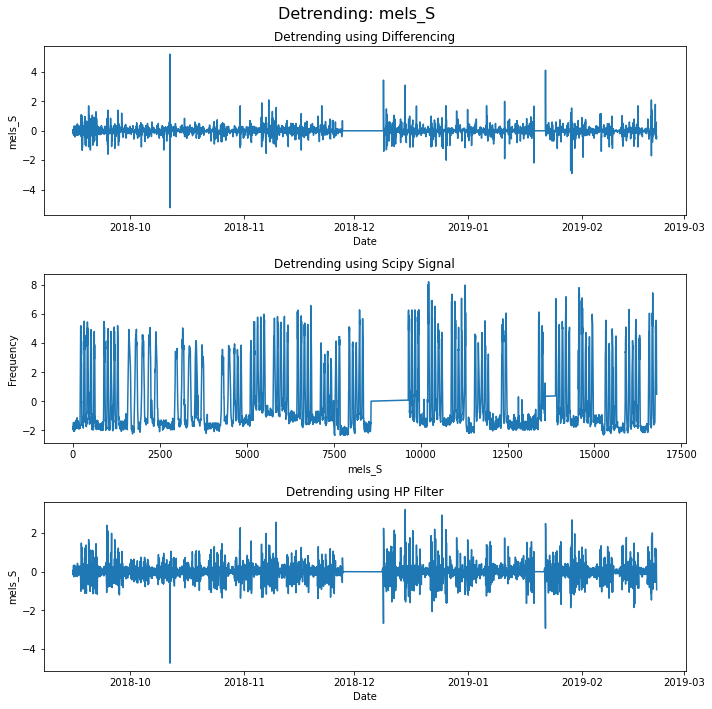

In [ ]:
plot_detrends(energy_use, var)

### 2. Seasonality 

We will study seasonality with Multiple Box Plots and Autocorrelation Plots:

#### Multiple Box Plots

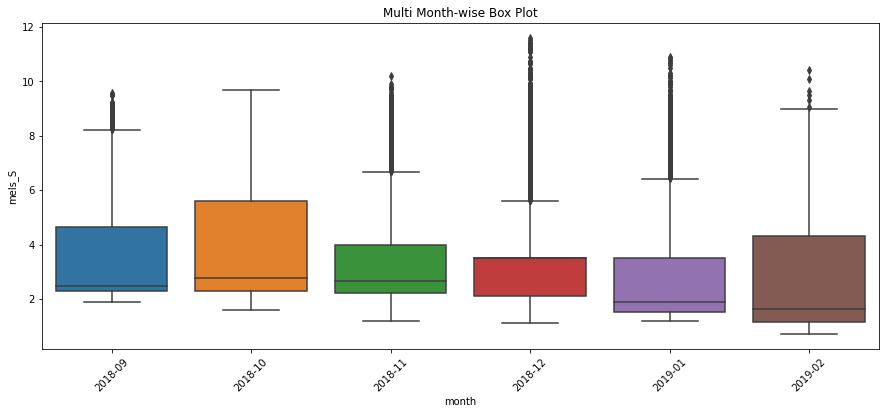

In [ ]:
energy_use['month'] = energy_use.index.to_period("M")
plt.figure(figsize=(15,6))
sns.boxplot(x='month', y=var, data=energy_use)
plt.title("Multi Month-wise Box Plot")
plt.xticks(rotation=45)
plt.show()

We don't see a seasonal pattern in the box plot, we will try to plot it again with detrended time series, using differencing:



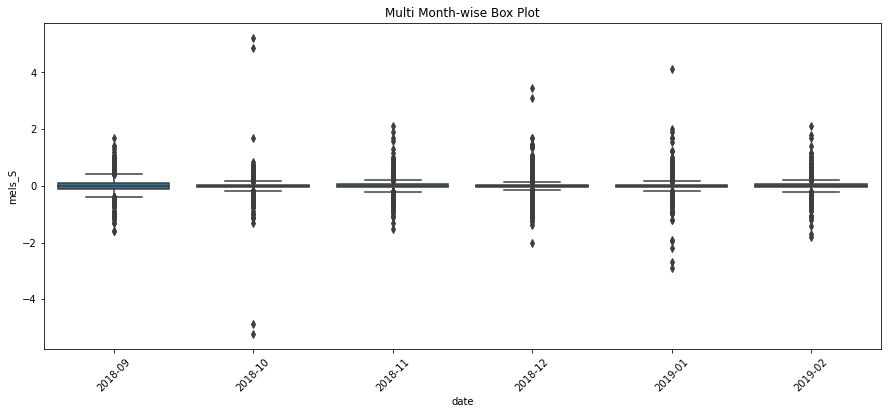

In [ ]:
diff = energy_use[var].diff()
months = diff.index.to_period("M")
diff.columns = [var, 'month']
plt.figure(figsize=(15,6))
sns.boxplot(x=months, y=diff)
plt.title("Multi Month-wise Box Plot")
plt.xticks(rotation=45)
plt.show()

Detrending didn't show any seasonality either.

#### Autocorrelation and partial autocorrelation plots

Mathematical explanation of autocorrelation plots: https://www.itl.nist.gov/div898/handbook/eda/section3/autocopl.htm



<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

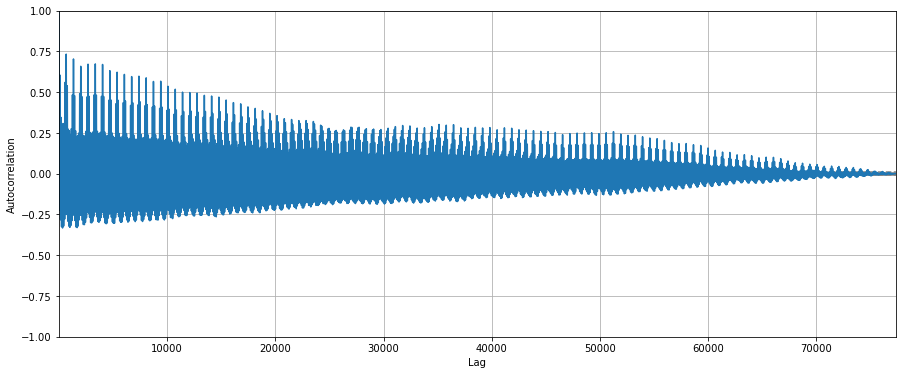

In [17]:
plt.figure(figsize=(15,6))
autocorrelation_plot(energy_use[var].tolist())

(0.0, 7000.0)

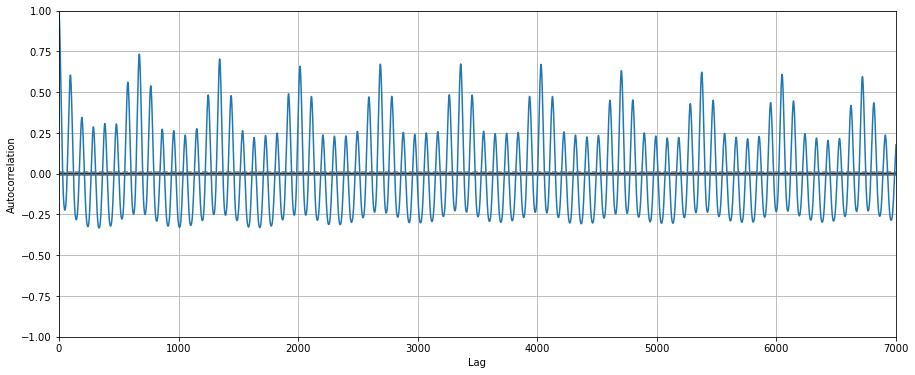

In [18]:
plt.figure(figsize=(15,6))

autocorrelation_plot(energy_use[var].tolist()).set_xlim([0,7000])

We can see that the initial autocorrelation plot didn't really show any seasonality, but once we "zoom in" (we change the lag in the x axis), we can clearly see some pattern. One reason for this could be that when we reduce the lag we are checking the pattern day by day, instead of a generic pattern, so clearly the correlation between measures at the same time of different days is going to be higher than the one between random measures in different days of the three years.


We check another way of plotting the same thing:




<Figure size 1080x432 with 0 Axes>

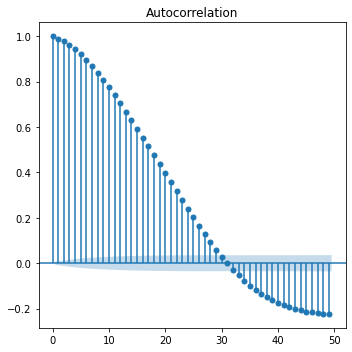

In [21]:
plt.figure(figsize=(15,6))
fig=plot_acf(energy_use[var])
fig.set_figheight(5)
fig.set_figwidth(5)
fig.tight_layout()
plt.show()

<Figure size 1080x432 with 0 Axes>

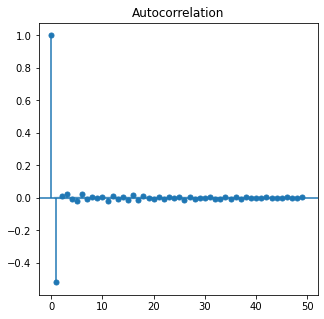

In [22]:
#We also plot the autocorrelation plot of the differenced time series:

fig =plt.figure(figsize=(15,6))
fig=plot_acf(energy_use[var].diff().diff().dropna())
fig.set_figheight(5)
fig.set_figwidth(5)
plt.show()

#### Partial Autocorrelation Plots

A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.

<Figure size 72x432 with 0 Axes>

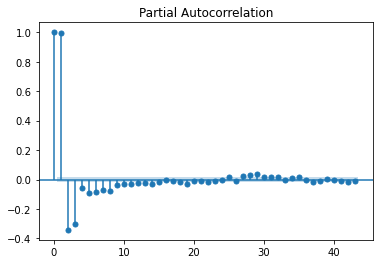

In [ ]:
plt.figure(figsize=(1,6))

plot_pacf(energy_use[var],method='ols' ) #Probar varios métodos
plt.show()

### 3. Seasonal decomposition

We can use seasonal decomposition to remove seasonality from data and check the data only with the trend, cyclic, and irregular variations.

In [23]:
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_seasonal_decompose(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    deseason = df[var] - result_mul.seasonal
    plt.figure(figsize=(15,6))
    plt.plot(deseason)
    plt.title('Deseasoning using seasonal_decompose (' +model+ ' model)', fontsize=12) 
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.show()



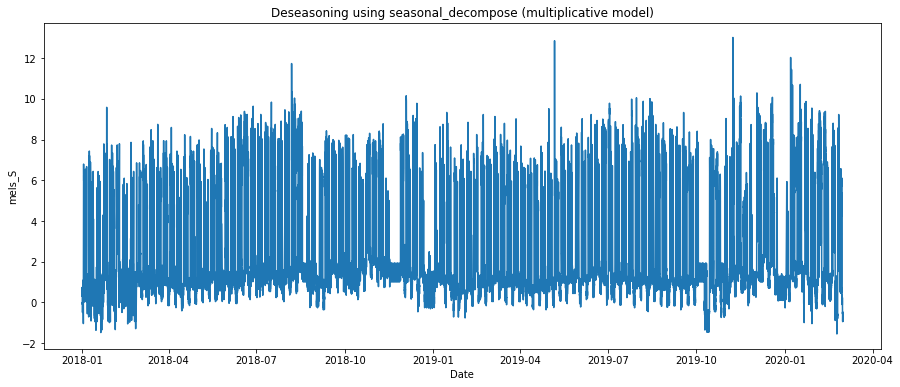

In [24]:
#FREQ OF DAY
plot_seasonal_decompose(energy_use, var, 'multiplicative', 96)

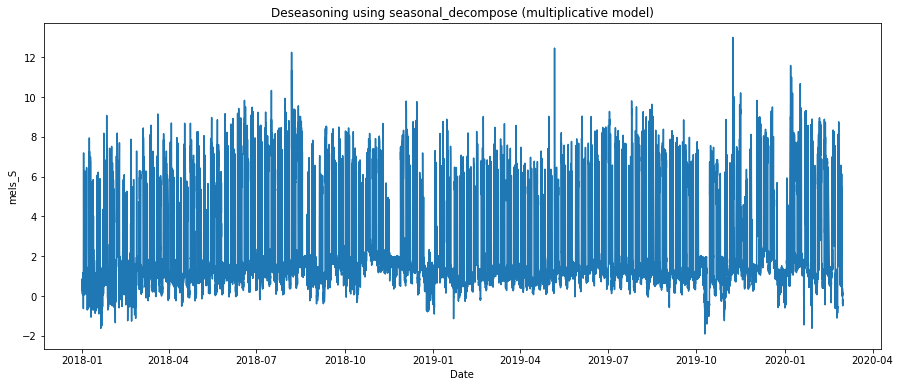

In [25]:
#FREQ OF DAY
plot_seasonal_decompose(energy_use, var, 'multiplicative', 672)

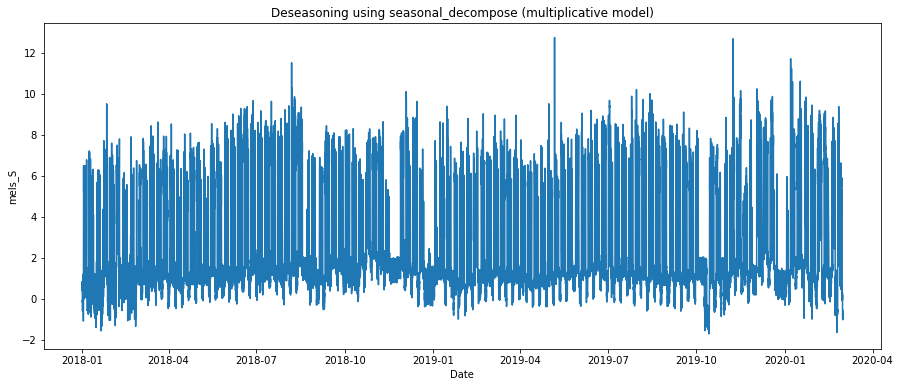

In [26]:
plot_seasonal_decompose(energy_use, var, 'multiplicative', 2880)

In [27]:

def plot_seasonal(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    res = result_mul.seasonal

    fig = go.Figure()
    result_mul = seasonal_decompose(energy_use[var], model=model, period = period)
    res = result_mul.seasonal
    fig.add_trace(
        go.Scatter(x=list(df.index), y=list(res)))

    # Set title
    fig.update_layout(
        title_text='seasonal_decompose (' +model+ ' model) with freq= ' +str(int(period/(4*24))) + " days", 
        title_font_size=20
    )

    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1m",
                        step="month",
                        stepmode="backward"),
                    dict(count=6,
                        label="6m",
                        step="month",
                        stepmode="backward"),
                    dict(count=1,
                        label="YTD",
                        step="year",
                        stepmode="todate"),
                    dict(count=1,
                        label="1d",
                        step="day",
                        stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig.show()


In [ ]:
plot_seasonal(energy_use, var, 'add', 96)

In [28]:
plot_seasonal(energy_use, var, 'add', 672)

In [29]:
plot_seasonal(energy_use, var, 'multiplicative', 2880)

### 4. Cyclical Components
Cyclical components are fluctuations around a long trend observed every few units of time. We will use one more time the HP Filter to detect them:

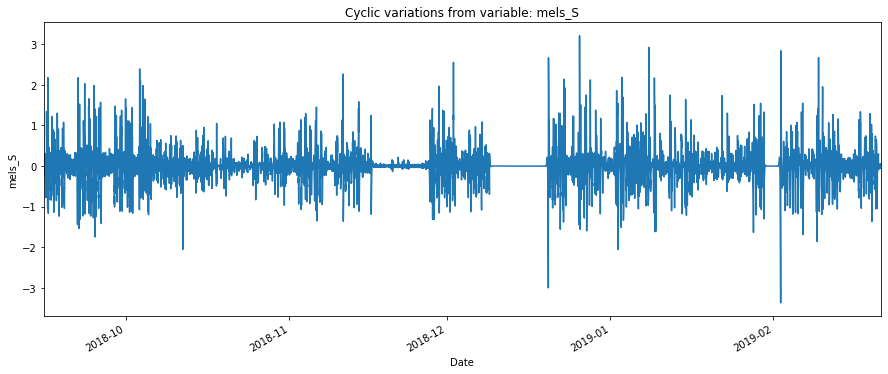

In [ ]:
def plot_hpfilter2(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_cycle.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.xlabel('Date')
    plt.ylabel(var)  
    plt.title(title)
plot_hpfilter2(energy_use, var, 'Cyclic variations from variable: ' + var)

### 5. Decomposition of time series



In [30]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

def mostrar_descomp(df, variable, period):
    # Multiplicative Decomposition 
    multiplicative_decomposition = seasonal_decompose(df[variable], model='multiplicative', period = period)

    # Additive Decomposition
    additive_decomposition = seasonal_decompose(df[variable], model='add', period = period)

    # Plot
    plt.rcParams.update({'figure.figsize': (10,8)})

    multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition with freq= ' +str(int(period/(4*24))) + " days", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    multiplicative_decomposition.plot().suptitle('Additive Decomposition with freq= ' +str(int(period/(4*24))) + " days", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    plt.show()




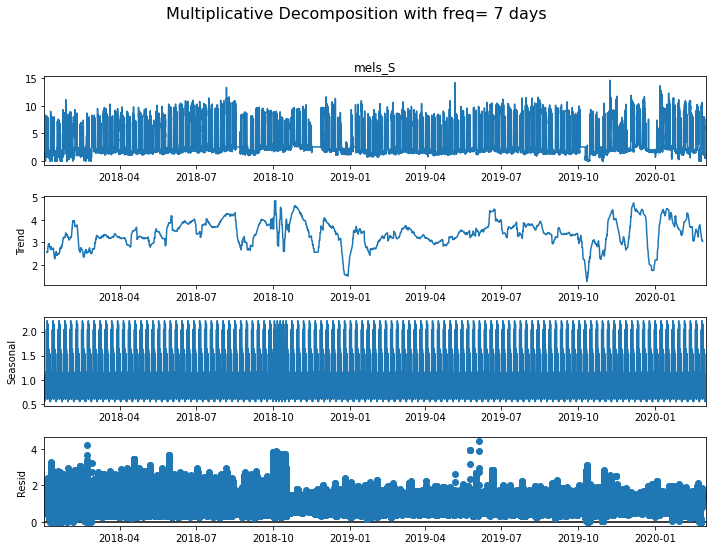

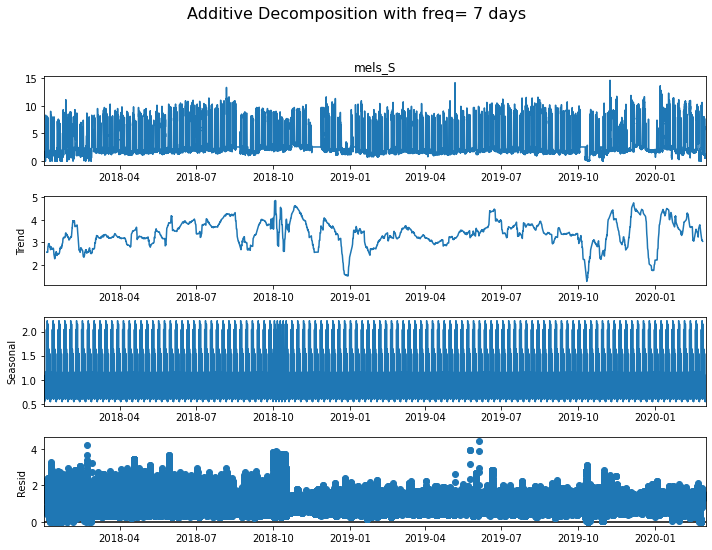

In [31]:
#Monthly period (means that the cycle of seasonality is a week)
mostrar_descomp(energy_use, var, 672)

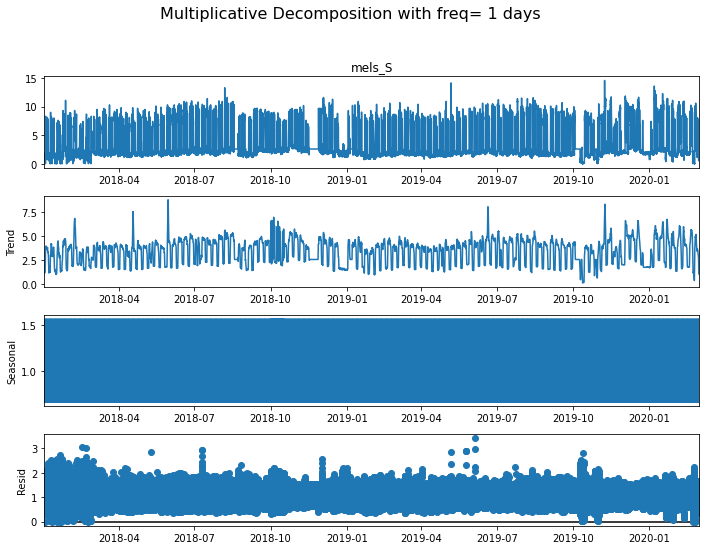

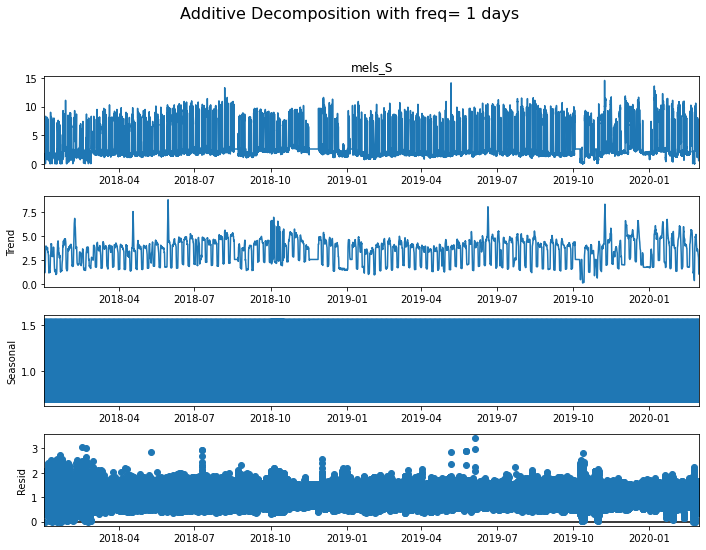

In [32]:
#Daily period (means that the cycle of seasonality is a day)
mostrar_descomp(energy_use, var, 96)

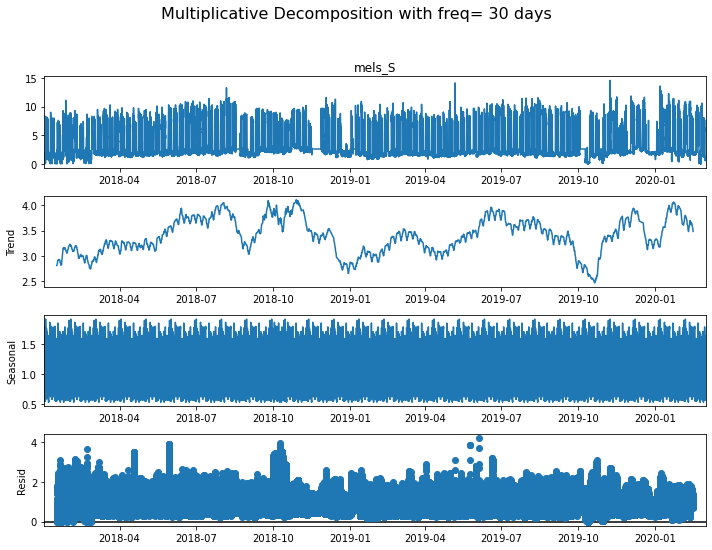

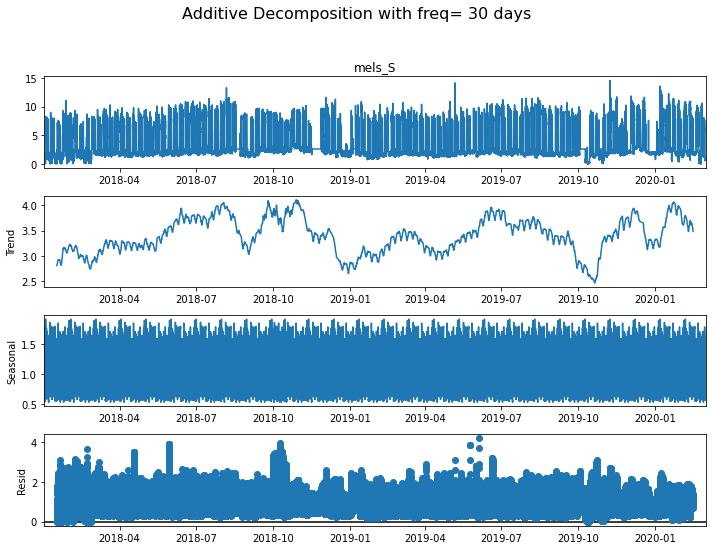

In [33]:
#Monthly period (means that the cycle of seasonality is a week)
mostrar_descomp(energy_use, var, 2880)

### 6. Rolling Statistics plot

We are going to plot the rolling mean and standard deviation of the time series, with a window of a week (672 rows)

In [34]:
def plot_rolling_stats(series, period):

    #Determine rolling statistics
    rolling_avg = series.rolling(window=period).mean() 
    rolling_std = series.rolling(window=period).std() 

    #Plot rolling statistics
    plt.figure(figsize=(15,7))
    plt.plot(series, color='#379BDB', label='Original')
    plt.plot(rolling_avg, color='#D22A0D', label='Rolling Mean')
    plt.plot(rolling_std, color='#142039', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation with rolling window of= ' +str(int(period/(4*24))) + " days")
    plt.show(block=False)




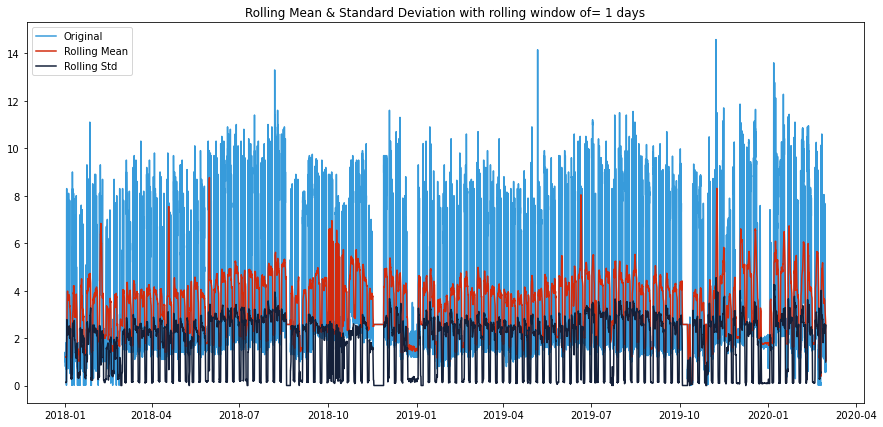

In [37]:
plot_rolling_stats(energy_use[var], 96)

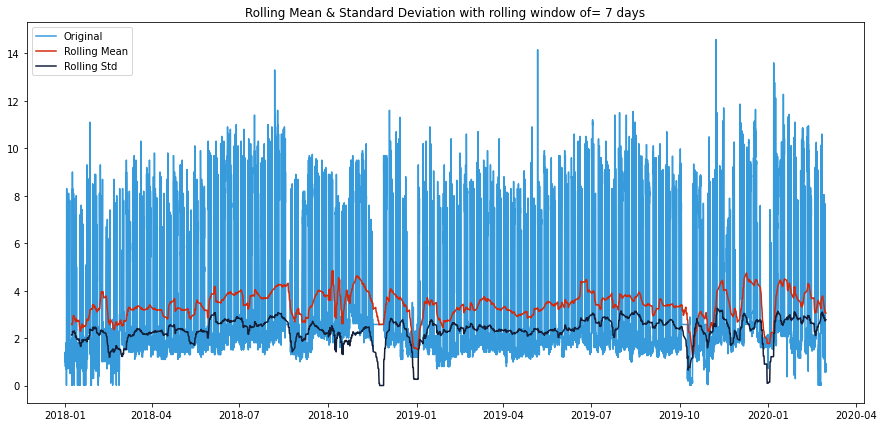

In [38]:
plot_rolling_stats(energy_use[var], 672)

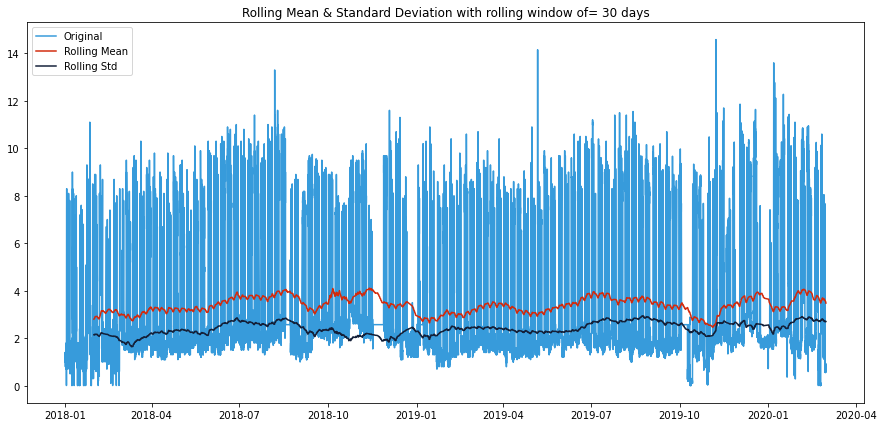

In [39]:
plot_rolling_stats(energy_use[var], 2880)

Next, we will repeat the exact same plot but this time with the differenced time series, to check how the statistical properties change with time:


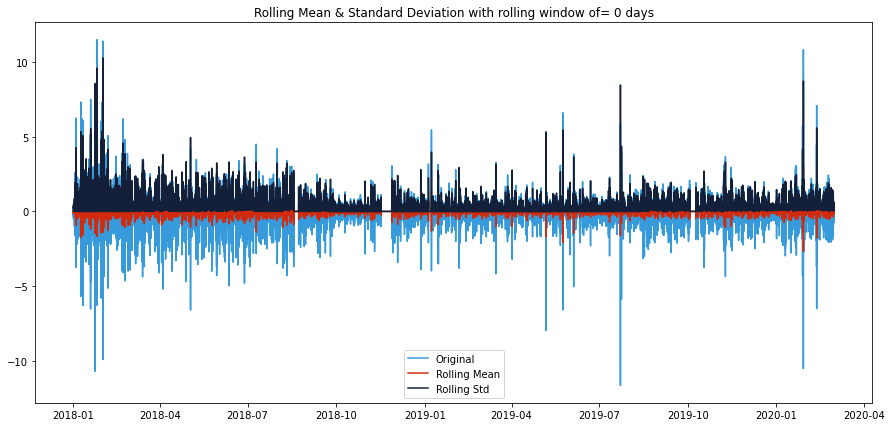

In [43]:
plot_rolling_stats(energy_use[var].diff().diff().dropna(), 4)

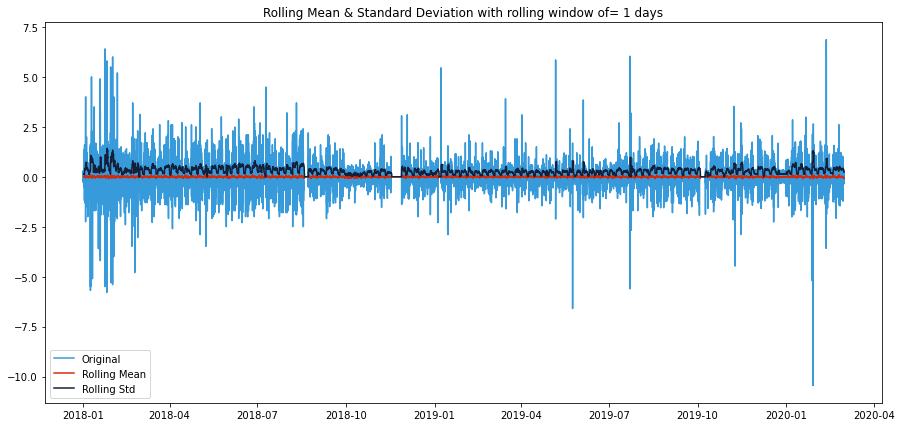

In [44]:
plot_rolling_stats(energy_use[var].diff().dropna(), 96)

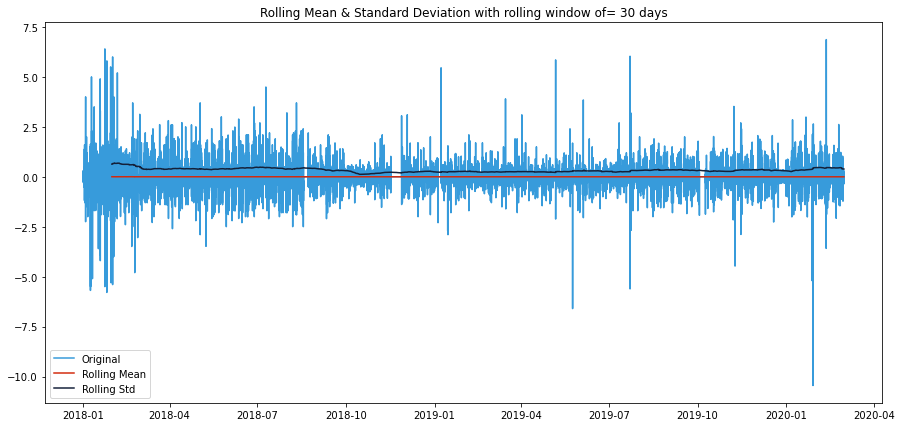

In [45]:
plot_rolling_stats(energy_use[var].diff().dropna(), 2880)

### 7. Dickey Fuller Test for stationarity

Finally, we will run the dickey fuller (https://atsa-es.github.io/atsa-labs/sec-boxjenkins-aug-dickey-fuller.html) test on this variable

In [46]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(energy_use[var], autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  

ADF Statistic: -20.240219688666897
n_lags: 0.0
p-value: 0.0
Critial Values:
   1%, -3.4304346035652356
Critial Values:
   5%, -2.8615773933293207
Critial Values:
   10%, -2.5667899031818053


Since the p-value is lower than 0.5, we can reject the null hypothesis: the time series is non stationary, this means that the time series is stationary.

We will now repeat the test with the differenced time series:

In [ ]:
result = adfuller(energy_use[var].diff().dropna(), autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  


ADF Statistic: -27.468272152897132
n_lags: 0.0
p-value: 0.0
Critial Values:
   1%, -3.430740442503284
Critial Values:
   5%, -2.86171256002052
Critial Values:
   10%, -2.5668618493040105


The result is the same, but in the plot we can see that the stationarity of the time series is much more evident in the differenced one.